# Fluids Mechanics: tracer advection

* Emmanuel Cosme, September 2020

This notebook aims at illustrating the concept of advection of a passive tracer by a fluid flow. The focus is made on the distinction between the lagrangian and eulerian viewpoints of transport. Mastering the notions introduced in notebook number 1 is required (scalar fields and vector fields, differential operators: gradient, divergence, rotational).

The theme is influenced by ocean dynamics. No need to know about these aspects to catch the essentials.

Understanding the python code is not essential to focus on theoretical notions and illustrations. However, sometimes the code helps understanding the theory.


## 0. Import standard python modules and define useful functions locally

### 0.1 Modules

In [1]:
import numpy as np
from scipy.interpolate import griddata

import matplotlib.pyplot as plt
import matplotlib.animation
%matplotlib inline

Import useful functions from local module:

In [2]:
import utils as ut
help(ut)

Help on module utils:

NAME
    utils - Auxiliary functions used in several notebooks of the repo.

FUNCTIONS
    derivative(field, axis=0)
        Compute partial derivative along given axis using second-order centered scheme.
    
    divergence(u, v)
        Compute divergence of a 2D-vector with components u, v.
    
    gradient(field)
        Compute gradient of input scalar field.
    
    grid_param()
    
    laplacian(field)
        Compute Laplacian of field.
    
    make_grid()
        Make a 1000 x 800 km^2 grid with Nx x Ny grid points. Returns:
        * Nx, Ny
        * dx, dy: grid steps
        * xm, ym: meshgrid arrays
    
    make_sla(x, y)
        Create a 2D field with arbitrary analytical functions
    
    rotational(u, v)
        Compute vertical component of rotational of a 2D-vector with components u, v.
    
    set_boundaries_to_zero(field)
    
    von_neuman_euler(field, axis=None)
        Apply Von Neuman boundary conditions to the field.

DATA
    Lx 

## 1. Creation of a 2-dimentional velocity field

We create a 2-dimensional, rectangular, horizontal domain typically covering a small fraction of the ocean. We create a "synthetic" (not real), normalized SLA field displaying cyclonic and anticyclonic eddies. From this SLA field, we derive the geostrophic velocity (current speed) field, defined as:
$$ u = - \frac{g}{f} \frac{\partial SLA}{\partial y}, \quad v = \frac{g}{f} \frac{\partial SLA}{\partial x} $$
where $g$ is gravity and $f$ the Coriolis factor, taken here at $10^{-4}$. $u$ represents the zonal (West to East) component of velocity, $v$ represents the meridional component (South to North). The components of geostrophic velocity are computed below and expressed in m/s.

In [3]:
dx, Nx, Ny, xm, ym = ut.grid_param()
sla = ut.make_sla(xm,ym)
u_geos = - 10/1e-4/1000 * ut.derivative(sla, axis=1)
v_geos =   10/1e-4/1000 * ut.derivative(sla, axis=0)

Plots:

Text(0.5, 1.0, 'Velocity vector field')

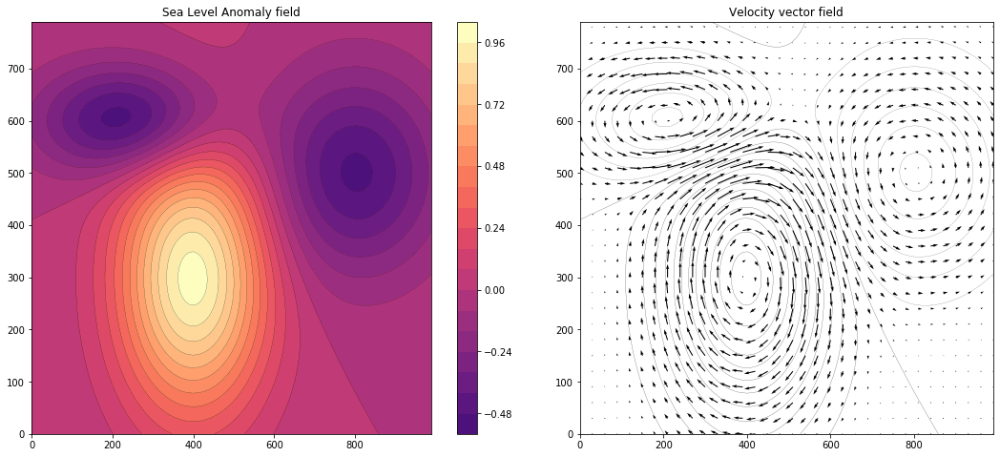

In [4]:
fig = plt.figure(figsize=(14, 6))
ax1 = fig.add_axes([0, 0, 0.52, 1])    # [left, bottom, width, height] 
ax2 = fig.add_axes([0.57, 0, 0.43, 1])

vmin, vmax = -1, 1
ax1.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
pc0=ax1.contourf(xm, ym, sla, 20, vmin=vmin, vmax=vmax, cmap = "magma")
ax1.set_title("Sea Level Anomaly field")
fig.colorbar(pc0, ax=ax1)

ax2.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
slsp = 3  # slicing step
ax2.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], u_geos[::slsp,::slsp], v_geos[::slsp,::slsp])
ax2.set_title("Velocity vector field")

## 2. Transport of tracers: Eulerian approach

A particle is introduced somewhere in the domain and transported by the flow. The numerical scheme used here requires a bilinear interpolation of the velocity fields, see this: <https://fr.wikipedia.org/wiki/Interpolation_bilin%C3%A9aire>

In [5]:
Initial_location = np.array([250,50])     # Set initial position of particle
dt = 180                                   # time step
Nt = 30                                   # Number of time steps

tracer_pos = Initial_location             # Initialize position
pos_series = np.empty((2,Nt+1))           # To store results for plots
pos_series[:,0] = tracer_pos

# Time evolution
x, y = xm[:,0], ym[0,:]

for it in range(Nt):
    ix, iy = np.searchsorted(x,tracer_pos[0]), np.searchsorted(y,tracer_pos[1])
    ix, iy = np.clip(ix, 0, Nx-1), np.clip(iy, 0, Ny-1)
    ddx, ddy = (tracer_pos[0]-x[ix])/dx[0], (tracer_pos[1]-y[iy])/dx[1]  # See wikipedia reference to understand this...
    u_int = u_geos[ix,iy] \
          + ddx * (u_geos[ix+1,iy] - u_geos[ix,iy]) \
          + ddy * (u_geos[ix,iy+1] - u_geos[ix,iy]) \
          + ddx*ddy * (u_geos[ix,iy] + u_geos[ix+1,iy+1] - u_geos[ix+1,iy] - u_geos[ix+1,iy])
    v_int = v_geos[ix,iy] \
          + ddx * (v_geos[ix+1,iy] - v_geos[ix,iy]) \
          + ddy * (v_geos[ix,iy+1] - v_geos[ix,iy]) \
          + ddx*ddy * (v_geos[ix,iy] + v_geos[ix+1,iy+1] - v_geos[ix+1,iy] - v_geos[ix+1,iy])
    tracer_pos = tracer_pos + np.array([u_int*dt, v_int*dt])
    pos_series[:,it+1] = tracer_pos

And the result is plotted (click on appropriate button to animate):

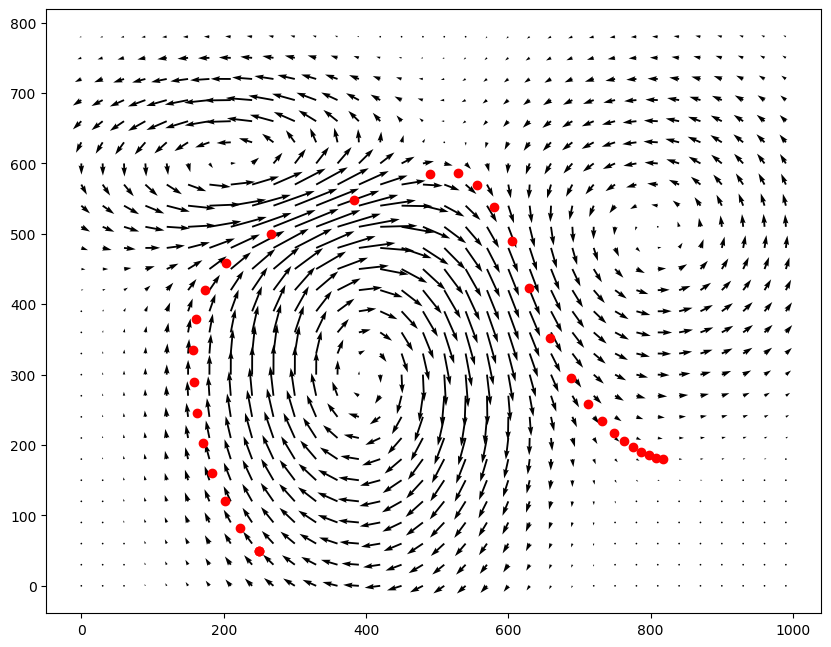

In [6]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 100  
plt.ioff()
fig, ax = plt.subplots(figsize=(10,8))
slsp = 3  # slicing step
q = ax.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], u_geos[::slsp,::slsp], v_geos[::slsp,::slsp])

def animate(t):
    ax.scatter(pos_series[0,t], pos_series[1,t], c='r')

matplotlib.animation.FuncAnimation(fig, animate, frames=Nt)

### Challenge 1

* Can you explain what the red dots represent exactly?
* How is the particle trajectory related to the velocity field?
* How comes that two consecutive positions are distant from each other around $x$=300, and close to each other around $x$=800?
* Have fun! Change the particle initial position (try (400, 300) for example) and make bets about the final position...
* How would you represent the particle position mathematically?

Beyond the scope of this notebook: play with the time step to illustrate numerical instabilities. Try $dt$=60 for example (and explain what happens, and why).

## 3. Transport of tracers: Eulerian approach

In the Eulerian approach, the tracers are not represented by particles (Lagrangian approach), but by a concentration field. Below, we create a synthetic, initial concentration field, then have it transported by the flow.

In [7]:
Initial_location = np.array([250,50])
dt = 180    # time step
Nt = 30   # Number of time step

# Make initial concentration field
def make_initial_conc(xq,yq):
    """Create an initial concentration field"""
    a = ( (xq-Initial_location[0])**2 + (yq-Initial_location[1])**2) *0.8e-4
    c = np.exp(-a/2)
    c /= np.max(c)
    return c
conc = make_initial_conc(xm, ym)
conc_series = np.empty((Nx,Ny,Nt+1))
conc_series[:,:,0] = conc

# And compute advection with a semi-lagrangian scheme
for it in range(Nt):
    xm_, ym_ = xm-u_geos*dt, ym-v_geos*dt
    conc = griddata((xm.flatten(),ym.flatten()), conc.flatten(), (xm_,ym_), method='linear')
    # Manage boundaries (no flux of tracers)
    p, q = np.where(xm_<xm.min()), np.where(xm_>xm.max())
    conc[p] = conc[q] = 0.
    p, q = np.where(ym_<ym.min()), np.where(ym_>ym.max())
    conc[p] = conc[q] = 0.
    
    conc_series[:,:,it+1] = conc

And the result is plotted. Click on the appropriate button to animate:

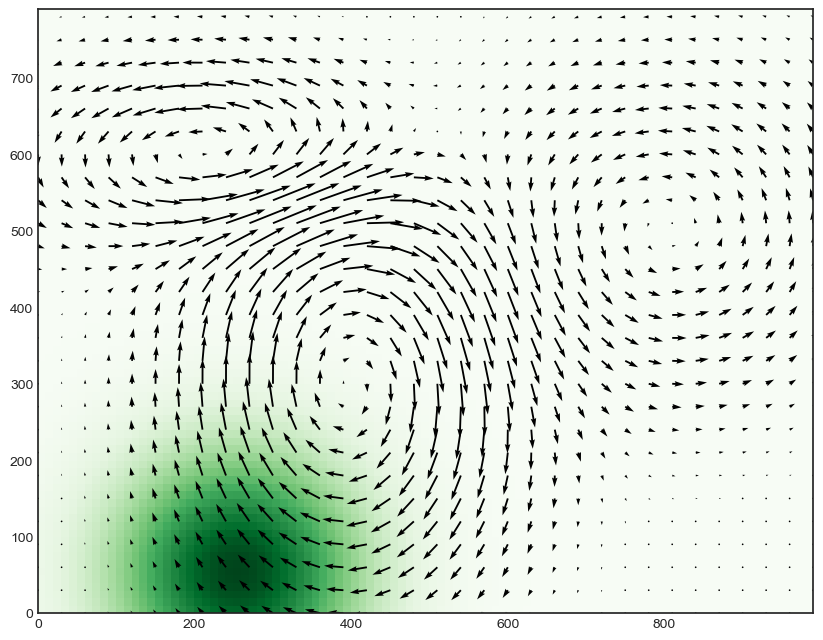

In [8]:
plt.style.use('seaborn-white')
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 100  
plt.ioff()
fig, ax = plt.subplots(figsize=(10,8))
slsp = 3  # slicing step
vmin, vmax = 0, 1

def animate(t):
    ax.pcolormesh(xm,ym,conc_series[:,:,t],cmap ='Greens', vmin = vmin, vmax = vmax)
    q = ax.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], u_geos[::slsp,::slsp], v_geos[::slsp,::slsp])
    
matplotlib.animation.FuncAnimation(fig, animate, frames=Nt)

### Challenge 2

* Can you explain what the green colors represent exactly?
* How would you represent the tracer concentration mathematically?
* The initial concentration field exhibits a circular pattern. What creates the deformation of this pattern during the transport?